In [1]:
import os
import tensorflow as tf
import tensorflow_datasets as tfds
import numpy as np
from collections import defaultdict
from IPython.display import Audio, display
from scipy.io import wavfile
from scipy.cluster.vq import kmeans2
from sklearn.decomposition import PCA
from matplotlib import pyplot as plt
from notebooks.tf.scheduler import SGDRScheduler

In [2]:
sample_rate, source_audio = wavfile.read("./data/donuts_hq.wav")
sample_start = sample_rate * 60
sample_end = sample_rate * 70
print("Sample rate:", sample_rate)

Sample rate: 32000


In [3]:
Audio(source_audio[sample_start:sample_end], rate=sample_rate)

In [4]:
def compress_with_pca(data, components, block_size=1024):
    samples = len(data)
    leftover = block_size - samples % block_size
    padded = np.lib.pad(data, (0, leftover), "constant", constant_values=0)
    
    reshaped = padded.reshape((len(padded) // block_size, block_size))
    
    pca = PCA(n_components=components)
    pca.fit(reshaped)
    
    transformed = pca.transform(reshaped)
    reconstructed = pca.inverse_transform(transformed).reshape((len(padded)))
    return pca, transformed, reconstructed

In [5]:
COMPONENT_COUNT = 24
SAMPLE_SIZE = 320

pca, transformed, constructed = compress_with_pca(
    source_audio, COMPONENT_COUNT, SAMPLE_SIZE
)
print(f"PCA Transformed audio shape: {transformed.shape}")
Audio(constructed[sample_start:sample_end], rate=sample_rate)

PCA Transformed audio shape: (17403, 24)


In [10]:
k = 1024
centroid, label = kmeans2(transformed, k, minit='points')

In [11]:
counts = np.bincount(label)
np.amax(counts)

464

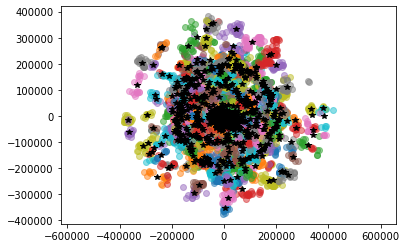

In [12]:
for i in range(k):
    w = transformed[label == i]
    plt.plot(w[:, 0], w[:, 1], "o", alpha=0.5, label=f"cluster {i}")

plt.plot(centroid[:, 0], centroid[:, 1], 'k*', label='centroids')
plt.axis('equal')
plt.show()

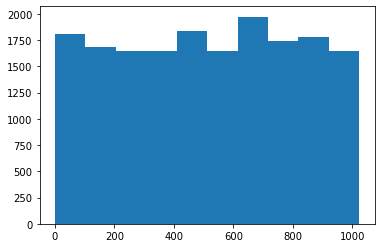

In [13]:
plt.hist(label)
plt.show()

In [14]:
label.shape

(17403,)

In [15]:
BATCH_COUNT = len(constructed) // SAMPLE_SIZE

data_scale = np.amax(np.abs(constructed))
normalized_data = constructed / data_scale

batched = (normalized_data[:BATCH_COUNT * SAMPLE_SIZE]).reshape((
    BATCH_COUNT, SAMPLE_SIZE
))
batched.shape

(17403, 320)

In [16]:
label[:30]

array([ 625,  625,  625,  924,  651,  836,    1,  637,   46, 1003,   72,
        227,  149,  431,  929,  395,  576,  940,    1,  518,  872,  924,
        124,  309,    1,   19,  929, 1003,   22,  227])

In [17]:
grouped_by_label = defaultdict(list)
for index, data in enumerate(batched):
    grouped_by_label[label[index]].append(data)

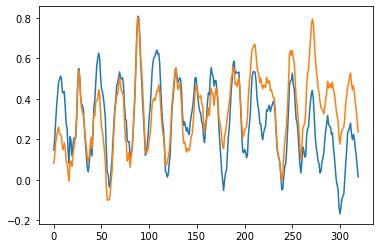

None

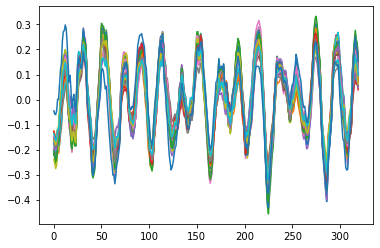

None

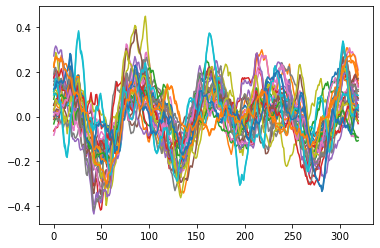

None

In [18]:
for entry in grouped_by_label[0]:
    plt.plot(entry)
display(plt.show())
for entry in grouped_by_label[2]:
    plt.plot(entry)
display(plt.show())
for entry in grouped_by_label[1000]:
    plt.plot(entry)
display(plt.show())

In [19]:
TRAINING_BATCH_SIZE = 64

In [20]:
sample_set = tf.data.Dataset.from_tensor_slices(batched)
label_set = tf.data.Dataset.from_tensor_slices(tf.one_hot(label, k))
zipped_set = tf.data.Dataset.zip((
    label_set, sample_set,
))
training_set = zipped_set.batch(TRAINING_BATCH_SIZE, drop_remainder=True)
training_set

<BatchDataset shapes: ((64, 1024), (64, 320)), types: (tf.float32, tf.float64)>

In [27]:
for labels, samples in training_set.take(1):
    label = labels[0]
    sample = samples[0]
    print(label.shape)
    print(sample.shape)
    print("Label index:", np.amax(label))
    display(Audio(sample * data_scale, rate=sample_rate))

(1024,)
(320,)
Label index: 1.0


In [21]:
def build_model(lc, h1, h2, oc):
    model = tf.keras.Sequential([
        tf.keras.layers.InputLayer(
            batch_size=TRAINING_BATCH_SIZE,
            input_shape=(lc,),
            dtype=tf.float32,
        ),
        tf.keras.layers.Dense(
            units=h1,
            dtype=tf.float32,
        ),
        tf.keras.layers.PReLU(),
        tf.keras.layers.Dense(
            units=h2,
            dtype=tf.float32,
        ),
        tf.keras.layers.PReLU(),
        tf.keras.layers.Dense(
            units=oc,
            dtype=tf.float32,
        ),
    ])
    return model, f"./training-checkpoints/k-means-audio-{lc}-{h1}-{h2}-{oc}"

model, checkpoint_dir = build_model(
    lc=k,
    h1=k,
    h2=k * 2,
    oc=SAMPLE_SIZE,
)
model.build()

latest_checkpoint = tf.train.latest_checkpoint(checkpoint_dir)
if latest_checkpoint:
    model.load_weights(latest_checkpoint)

model.summary()
model.compile("adam", loss=tf.keras.losses.MSE)

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (64, 1024)                1049600   
_________________________________________________________________
p_re_lu (PReLU)              (64, 1024)                1024      
_________________________________________________________________
dense_1 (Dense)              (64, 2048)                2099200   
_________________________________________________________________
p_re_lu_1 (PReLU)            (64, 2048)                2048      
_________________________________________________________________
dense_2 (Dense)              (64, 320)                 655680    
Total params: 3,807,552
Trainable params: 3,807,552
Non-trainable params: 0
_________________________________________________________________


In [22]:
checkpoint_prefix = os.path.abspath(
    os.path.join(checkpoint_dir, "ckpt_{epoch}")
)

checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_prefix,
    save_weights_only=True,
    monitor="loss",
    save_best_only=True,
    period=10,
)

learningrate_callback = SGDRScheduler(
    min_lr=1e-6,
    max_lr=1e-3,
    steps_per_epoch=54,
    lr_decay=0.9,
    cycle_length=5,
    mult_factor=1.5
)

In [ ]:
EPOCHS = 500
history = model.fit(
    training_set,
    epochs=EPOCHS,
    callbacks=[
        checkpoint_callback,
        learningrate_callback,
    ],
)

Train for 271 steps
Epoch 1/500
271/271 [==============================] - 1s 5ms/step - loss: 0.0072
Epoch 2/500
271/271 [==============================] - 1s 4ms/step - loss: 0.0074
Epoch 3/500
271/271 [==============================] - 1s 5ms/step - loss: 0.0074
Epoch 4/500
271/271 [==============================] - 1s 5ms/step - loss: 0.0074
Epoch 5/500
271/271 [==============================] - 1s 5ms/step - loss: 0.0074
Epoch 6/500
271/271 [==============================] - 1s 5ms/step - loss: 0.0076
Epoch 7/500
271/271 [==============================] - 1s 5ms/step - loss: 0.0083
Epoch 8/500
271/271 [==============================] - 1s 5ms/step - loss: 0.0083
Epoch 9/500
271/271 [==============================] - 1s 5ms/step - loss: 0.0081
Epoch 10/500
271/271 [==============================] - 1s 4ms/step - loss: 0.0086
Epoch 11/500
271/271 [==============================] - 1s 4ms/step - loss: 0.0084
Epoch 12/500
271/271 [==============================] - 1s 5ms/step - loss: 

271/271 [==============================] - 1s 5ms/step - loss: 0.0068
Epoch 100/500
271/271 [==============================] - 1s 4ms/step - loss: 0.0068
Epoch 101/500
271/271 [==============================] - 1s 5ms/step - loss: 0.0068
Epoch 102/500
271/271 [==============================] - 1s 4ms/step - loss: 0.0067
Epoch 103/500
271/271 [==============================] - 1s 5ms/step - loss: 0.0067
Epoch 104/500
271/271 [==============================] - 1s 5ms/step - loss: 0.0067
Epoch 105/500
271/271 [==============================] - 1s 5ms/step - loss: 0.0067
Epoch 106/500
271/271 [==============================] - 1s 5ms/step - loss: 0.0067
Epoch 107/500
271/271 [==============================] - 1s 5ms/step - loss: 0.0067
Epoch 108/500
271/271 [==============================] - 1s 5ms/step - loss: 0.0067
Epoch 109/500
271/271 [==============================] - 1s 4ms/step - loss: 0.0068
Epoch 110/500
271/271 [==============================] - 1s 4ms/step - loss: 0.0068
Epoch 

271/271 [==============================] - 1s 4ms/step - loss: 0.0073
Epoch 197/500
271/271 [==============================] - 1s 5ms/step - loss: 0.0076
Epoch 198/500
271/271 [==============================] - 1s 5ms/step - loss: 0.0074
Epoch 199/500
271/271 [==============================] - 1s 4ms/step - loss: 0.0073
Epoch 200/500
271/271 [==============================] - 1s 4ms/step - loss: 0.0073
Epoch 201/500
271/271 [==============================] - 1s 4ms/step - loss: 0.0073
Epoch 202/500
271/271 [==============================] - 1s 4ms/step - loss: 0.0074
Epoch 203/500
271/271 [==============================] - 1s 5ms/step - loss: 0.0070
Epoch 204/500
271/271 [==============================] - 1s 5ms/step - loss: 0.0069
Epoch 205/500
271/271 [==============================] - 1s 5ms/step - loss: 0.0069
Epoch 206/500
271/271 [==============================] - 1s 4ms/step - loss: 0.0068
Epoch 207/500
271/271 [==============================] - 1s 5ms/step - loss: 0.0068
Epoch 

271/271 [==============================] - 1s 5ms/step - loss: 0.0072
Epoch 294/500
271/271 [==============================] - 1s 5ms/step - loss: 0.0072
Epoch 295/500
271/271 [==============================] - 1s 5ms/step - loss: 0.0072
Epoch 296/500
271/271 [==============================] - 1s 5ms/step - loss: 0.0072
Epoch 297/500
271/271 [==============================] - 1s 5ms/step - loss: 0.0072
Epoch 298/500
271/271 [==============================] - 1s 4ms/step - loss: 0.0073
Epoch 299/500
271/271 [==============================] - 1s 4ms/step - loss: 0.0073
Epoch 300/500
271/271 [==============================] - 1s 5ms/step - loss: 0.0074
Epoch 301/500
271/271 [==============================] - 1s 5ms/step - loss: 0.0073
Epoch 302/500
271/271 [==============================] - 1s 5ms/step - loss: 0.0075
Epoch 303/500
271/271 [==============================] - 1s 5ms/step - loss: 0.0075
Epoch 304/500
271/271 [==============================] - 1s 4ms/step - loss: 0.0077
Epoch 

In [53]:
labels_test = label_set.batch(TRAINING_BATCH_SIZE, drop_remainder=True)
output = np.array([], np.float32)

for batch in labels_test:
    res = model(batch).numpy().flatten()
    output = np.concatenate((output, res))

In [54]:
Audio(output, rate=sample_rate)